In [1]:
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE

In [2]:
verbose = False

In [3]:
!head -n 10 ../datasets/grb_table_1719839959.txt


GRB	Time [UT]	Trigger Number	BAT RA (J2000)	BAT Dec (J2000)	BAT 90% Error Radius [arcmin]	BAT T90 [sec]	BAT Fluence (15-150 keV) [10^-7 erg/cm^2]	BAT Fluence 90% Error (15-150 keV) [10^-7 erg/cm^2]	BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec]	BAT 1-sec Peak Photon Flux 90% Error (15-150 keV) [ph/cm^2/sec]	BAT Photon Index (15-150 keV) (PL = simple power-law, CPL = cutoff power-law)	BAT Photon Index 90% Error (15-150 keV)	XRT RA (J2000)	XRT Dec (J2000)	XRT 90% Error Radius [arcsec]	XRT Time to First Observation [sec]	XRT Early Flux (0.3-10 keV) [10^-11 erg/cm^2/s]	XRT 11 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]	XRT 24 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]	XRT Initial Temporal Index	XRT Spectral Index (Gamma)	XRT Column Density (NH) [10^21 cm^-2]	UVOT RA (J2000)	UVOT Dec (J2000)	UVOT 90% Error Radius [arcsec]	UVOT Time to First Observation [sec]	UVOT Magnitude	UVOT Other Filter Magnitudes	Other Observatory Detections	Redshift	Host Galaxy	Comments	References	Burst Advocate

In [4]:
df = pd.read_csv('../datasets/grb_table_1729082755.txt', encoding='ISO-8859-1', delimiter='\t')
df

,GRB,Time [UT],Trigger Number,BAT RA (J2000),BAT Dec (J2000),BAT 90% Error Radius [arcmin],BAT T90 [sec],BAT Fluence (15-150 keV) [10^-7 erg/cm^2],BAT Fluence 90% Error (15-150 keV) [10^-7 erg/cm^2],BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec],...,UVOT 90% Error Radius [arcsec],UVOT Time to First Observation [sec],UVOT Magnitude,UVOT Other Filter Magnitudes,Other Observatory Detections,Redshift,Host Galaxy,Comments,References,Burst Advocate
0,241006A,21:51:58,1258721,304.794,-40.796,3,NaN,NaN,NaN,NaN,...,NaN,350,V>17.4,B>19.0|U>17.9|UVW1>18.8|White>21.0,NaN,NaN,NaN,UVOT: no detection,NaN,Rahul Gupta
1,241002A,00:50:22,1257556,140.942,39.829,1.0,46.81,21,1,1.70,...,NaN,116,V>19.8,B>19.8|U>19.6|UVW1>19.0|UVW2>20.5|UVM2>20.3|Wh...,NaN,NaN,NaN,UVOT: no detection,NaN,Regina Caputo
2,241001A,17:08:45,SVOM-ECLAIRs,20.42,-43.53,NaN,NaN,NaN,NaN,NaN,...,NaN,6534,NaN,U=20.20,NaN,NaN,NaN,SVOM-ECLAIRs: GCN 37655|XRT: Source 2 is spati...,NaN,NaN
3,240916A,01:22:55,Fermi,233.2,-7.1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fermi: GCN 37518,NaN,NaN
4,240912A,01:46:39,1253910,124.625,33.999,1.0,113.24,450,0,15.80,...,0.43,115,V=17.78,B=19.08|U=18.14|UVW1=17.76|UVM2>17.18|UVW2=18....,"Fermi (GBM), GTC (10.4m), NOT (2.56m), INTEGRA...",1.234 (GTC: absorption)|1.23 (NOT: absorption),"g = 23.08, r = 22.88, and z = 22.01 (LCOGT/Leg...",NaN,NaN,Phil Evans
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1871,041220,22:58:27,100433,291.288,60.598,1.0,5.600,3.83,0.28,1.81,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BAT: FRED|No AT slew|XRT: no observation|UVOT:...,NaN,NaN
1872,041219C,20:30:34,100380*,343.926,-76.744,1.0,4.800,13.10,0.73,2.45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,BAT: 3 spikes|No AT slew|XRT: no observation|U...,NaN,NaN
1873,041219B,15:38:48,100367*,167.674,-33.458,7.0,30,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,IPN,NaN,NaN,"BAT: 1 big spike, 3 little spikes|No AT slew|X...",NaN,NaN
1874,041219A,01:42:18,100307|100319,6.154,62.847,7.0,520,1550,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"BAT: bright, long, multipeaked|No AT slew|XRT:...",NaN,NaN


In [5]:

df = pd.read_csv('../datasets/grb_table_1729082755.txt', encoding='ISO-8859-1', delimiter='\t')
df.dropna(subset=['BAT RA (J2000)', 'BAT Dec (J2000)',"BAT T90 [sec]"], inplace=True)

# df.fillna(-1, inplace=True)

columns_to_drop = ['BAT T90 [sec]', 'GRB', 'Time [UT]',"Trigger Number","BAT RA (J2000)","BAT Fluence 90% Error (15-150 keV) [10^-7 erg/cm^2]",'BAT Dec (J2000)', 'BAT 90% Error Radius [arcmin]',"XRT Column Density (NH) [10^21 cm^-2]","BAT 1-sec Peak Photon Flux 90% Error (15-150 keV) [ph/cm^2/sec]","BAT Photon Index 90% Error (15-150 keV)","XRT 90% Error Radius [arcsec]","XRT Time to First Observation [sec]","UVOT Time to First Observation [sec]"]
# print(fdf.columns)
for column in df.columns :
    df[column] = df[column].replace({'~': ''}, regex=True)  # Remove '~' character
    df[column] = pd.to_numeric(df[column], errors='coerce')  # Convert to numeric, setting errors to NaN
    found_ratio = df[column].count()/df[column].index.size
    if verbose :
        print(f"Missing values in {column} : {df[column].count()} over {df[column].index.size} for a % of : {found_ratio}")
    if (found_ratio*100 < 75.0) :
        columns_to_drop.append(column)
        print(f"Missing values in {column} : {df[column].count()} over {df[column].index.size} for a % of : {found_ratio}")
        print(f"Dropping column {column} not enough usable data")

fdf = df.drop(columns=columns_to_drop, axis=1)



Missing values in GRB : 324 over 1551 for a % of : 0.20889748549323017
Dropping column GRB not enough usable data
Missing values in Time [UT] : 0 over 1551 for a % of : 0.0
Dropping column Time [UT] not enough usable data
Missing values in BAT Photon Index (15-150 keV) (PL = simple power-law, CPL = cutoff power-law) : 11 over 1551 for a % of : 0.0070921985815602835
Dropping column BAT Photon Index (15-150 keV) (PL = simple power-law, CPL = cutoff power-law) not enough usable data
Missing values in XRT RA (J2000) : 0 over 1551 for a % of : 0.0
Dropping column XRT RA (J2000) not enough usable data
Missing values in XRT Dec (J2000) : 0 over 1551 for a % of : 0.0
Dropping column XRT Dec (J2000) not enough usable data
Missing values in XRT Early Flux (0.3-10 keV) [10^-11 erg/cm^2/s] : 681 over 1551 for a % of : 0.43907156673114117
Dropping column XRT Early Flux (0.3-10 keV) [10^-11 erg/cm^2/s] not enough usable data
Missing values in UVOT RA (J2000) : 0 over 1551 for a % of : 0.0
Dropping c

In [6]:
fdf.columns

Index(['BAT Fluence (15-150 keV) [10^-7 erg/cm^2]',
       'BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec]',
       'XRT 11 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]',
       'XRT 24 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]',
       'XRT Initial Temporal Index', 'XRT Spectral Index (Gamma)'],
      dtype='object')

In [7]:
columns_to_drop

['BAT T90 [sec]',
 'GRB',
 'Time [UT]',
 'Trigger Number',
 'BAT RA (J2000)',
 'BAT Fluence 90% Error (15-150 keV) [10^-7 erg/cm^2]',
 'BAT Dec (J2000)',
 'BAT 90% Error Radius [arcmin]',
 'XRT Column Density (NH) [10^21 cm^-2]',
 'BAT 1-sec Peak Photon Flux 90% Error (15-150 keV) [ph/cm^2/sec]',
 'BAT Photon Index 90% Error (15-150 keV)',
 'XRT 90% Error Radius [arcsec]',
 'XRT Time to First Observation [sec]',
 'UVOT Time to First Observation [sec]',
 'GRB',
 'Time [UT]',
 'BAT Photon Index (15-150 keV) (PL = simple power-law, CPL = cutoff power-law)',
 'XRT RA (J2000)',
 'XRT Dec (J2000)',
 'XRT Early Flux (0.3-10 keV) [10^-11 erg/cm^2/s]',
 'UVOT RA (J2000)',
 'UVOT Dec (J2000)',
 'UVOT 90% Error Radius [arcsec]',
 'UVOT Magnitude',
 'UVOT Other Filter Magnitudes',
 'Other Observatory Detections',
 'Redshift',
 'Host Galaxy',
 'Comments',
 'References',
 'Burst Advocate']

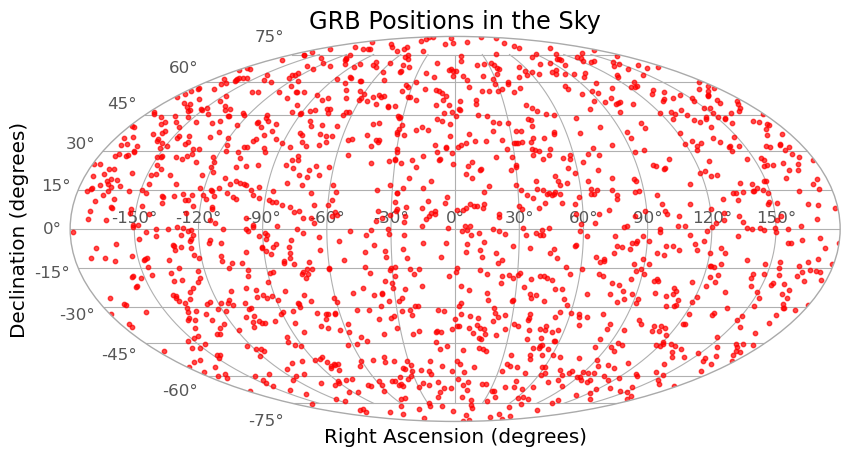

In [8]:
import matplotlib.pyplot as plt
from astropy.visualization import astropy_mpl_style
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.visualization.wcsaxes import WCSAxes
plt.style.use(astropy_mpl_style)

ra = df['BAT RA (J2000)']
dec = df['BAT Dec (J2000)']

coords = SkyCoord(ra=ra.values * u.degree, dec=dec.values * u.degree, frame='icrs')

plt.figure(figsize=(10, 5))
plt.subplot(projection='mollweide')
plt.scatter(coords.ra.wrap_at(180 * u.deg).radian, coords.dec.radian, s=10, c='red', marker='o', alpha=0.7)

plt.grid(True)
plt.title('GRB Positions in the Sky')
plt.xlabel('Right Ascension (degrees)')
plt.ylabel('Declination (degrees)')

plt.show()


In [9]:
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from scipy.stats import gaussian_kde


# Mollweide projection conversion
def mollweide_projection(ra, dec):
    ra_rad = np.radians(ra - 180)  # Shift RA to center around 0
    dec_rad = np.radians(dec)
    x = 2 * np.sqrt(2) * ra_rad * np.cos(dec_rad / 2) / np.pi
    y = np.sqrt(2) * np.sin(dec_rad / 2)
    return x, y

# Get Mollweide projected coordinates
x, y = mollweide_projection(df['BAT RA (J2000)'].values, df['BAT Dec (J2000)'].values)

# Gaussian smearing
def gaussian_smear(x, y, bandwidth=0.1, num_points=1000):
    # Create a Gaussian KDE
    xy = np.vstack([x, y])
    kde = gaussian_kde(xy, bw_method=bandwidth)

    # Generate points for the smoothed plot
    x_grid = np.linspace(x.min(), x.max(), num_points)
    y_grid = np.linspace(y.min(), y.max(), num_points)
    x_mesh, y_mesh = np.meshgrid(x_grid, y_grid)
    positions = np.vstack([x_mesh.ravel(), y_mesh.ravel()])
    values = kde(positions).reshape(x_mesh.shape)

    return x_mesh, y_mesh, values

# Perform Gaussian smearing
x_mesh, y_mesh, values = gaussian_smear(x, y)

# Output to Jupyter notebook
output_notebook()

# Create a Bokeh figure for the Mollweide projection
p = figure(title="GRB Positions with Gaussian Smear", 
           x_axis_label="X (Mollweide)", 
           y_axis_label="Y (Mollweide)", 
           plot_width=800, 
           plot_height=400)

# Add the Gaussian smear as an image
p.image(image=[values], x=x.min(), y=y.min(), dw=x.max()-x.min(), dh=y.max()-y.min(), palette="Viridis256", level="image")

# Overlay the original scatter points
p.circle(x, y, size=5, color="navy", alpha=0.5)

# Show the plot
show(p)

Loading BokehJS ...

In [10]:
fdf

,BAT Fluence (15-150 keV) [10^-7 erg/cm^2],BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec],XRT 11 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s],XRT 24 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s],XRT Initial Temporal Index,XRT Spectral Index (Gamma)
1,21.00,1.70,0.071449,0.045932,-0.8129,2.147414
4,450.00,15.80,0.000416,0.000041,-4.2890,1.855251
8,38.00,0.00,NaN,NaN,NaN,NaN
11,250.00,100.00,1.028110,0.376898,-3.0020,1.781072
13,13.00,0.70,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
1871,3.83,1.81,NaN,NaN,NaN,NaN
1872,13.10,2.45,NaN,NaN,NaN,NaN
1873,NaN,NaN,NaN,NaN,NaN,NaN
1874,1550.00,NaN,NaN,NaN,NaN,NaN


Number of NaN values in the BAT Fluence (15-150 keV) [10^-7 erg/cm^2]: 17
Number of NaN values in the BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec]: 48
Number of NaN values in the XRT 11 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]: 281
Number of NaN values in the XRT 24 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]: 268
Number of NaN values in the XRT Initial Temporal Index: 258
Number of NaN values in the XRT Spectral Index (Gamma): 235


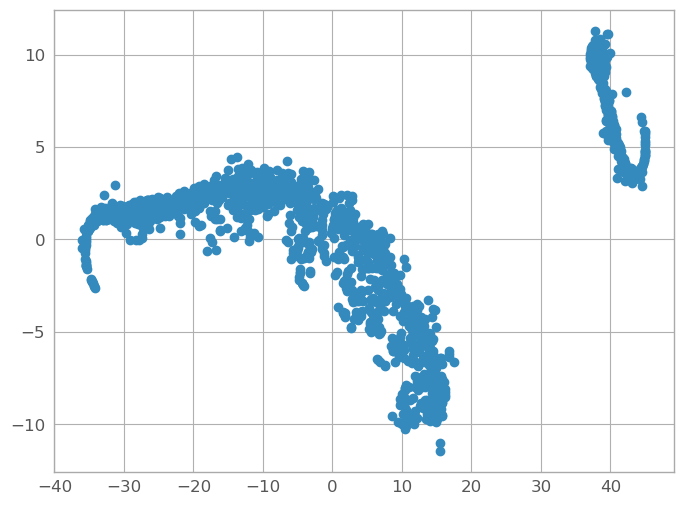

In [11]:
from sklearn.manifold import TSNE

# Sample DataFrame creation (Replace this with your actual DataFrame)
# df = pd.read_csv("your_data_file.csv")
for column in fdf.columns :
    nan_count = fdf[column].isna().sum()
    print(f"Number of NaN values in the {column}: {nan_count}")



# Impute NaN values with column means
# df_imputed = fdf.fillna(fdf.mean())

filter_nans = False

if filter_nans :
    fdf = fdf.dropna()
    df = df.loc[fdf.index]
    df_imputed = fdf
else :
    df_imputed = fdf.fillna(fdf.mean())

tsne = TSNE(n_components=2, random_state=50,early_exaggeration=20,perplexity=120)
tsne_result = tsne.fit_transform(df_imputed)

# Convert the result to a DataFrame for further analysis
tsne_df = pd.DataFrame(tsne_result, columns=['x', 'y'],index=fdf.index)
plt.scatter(tsne_df.x,tsne_df.y)

<Axes: ylabel='Density'>

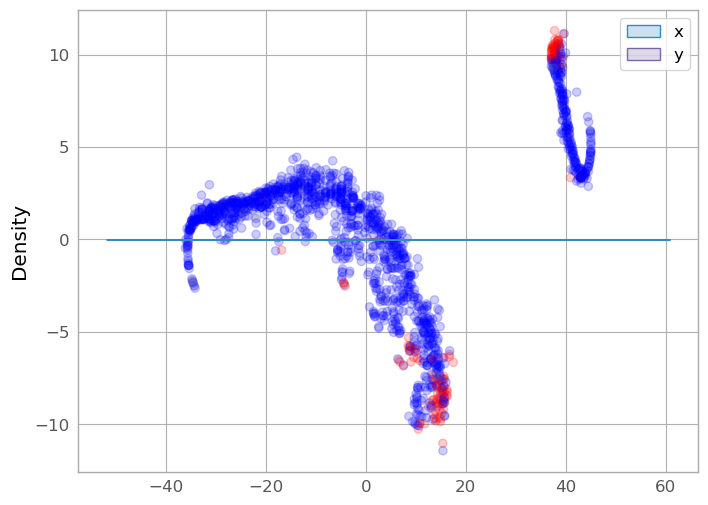

In [12]:
import seaborn as sns

colors = []
# for GRB in fdf.index :
#     if math.isnan(fdf["BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec]"][GRB]) :
#         colors.append("red")
#     elif math.isnan(fdf["XRT 24 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]"][GRB]) :
#         colors.append("blue")
#     elif math.isnan(fdf["XRT 11 Hour Flux (0.3-10 keV) [10^-11 erg/cm^2/s]"][GRB]) :
#         colors.append("cyan")
#     elif math.isnan(fdf["BAT 1-sec Peak Photon Flux (15-150 keV) [ph/cm^2/sec]"][GRB]) :
#         colors.append("green")
#     else :
#         colors.append("Gray")

short_tninety= []
long_tninety= []
for GRB in df.index :
    if df["BAT T90 [sec]"].loc[GRB] > 2.0:
        colors.append("blue")
        long_tninety.append(GRB)
    elif df["BAT T90 [sec]"].loc[GRB] < 2.0 :
        colors.append("red")
        short_tninety.append(GRB)
    else :
        colors.append("Gray")

plt.scatter(tsne_df.x,tsne_df.y,c=colors,alpha=0.2)
sns.kdeplot(tsne_df, fill=True)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


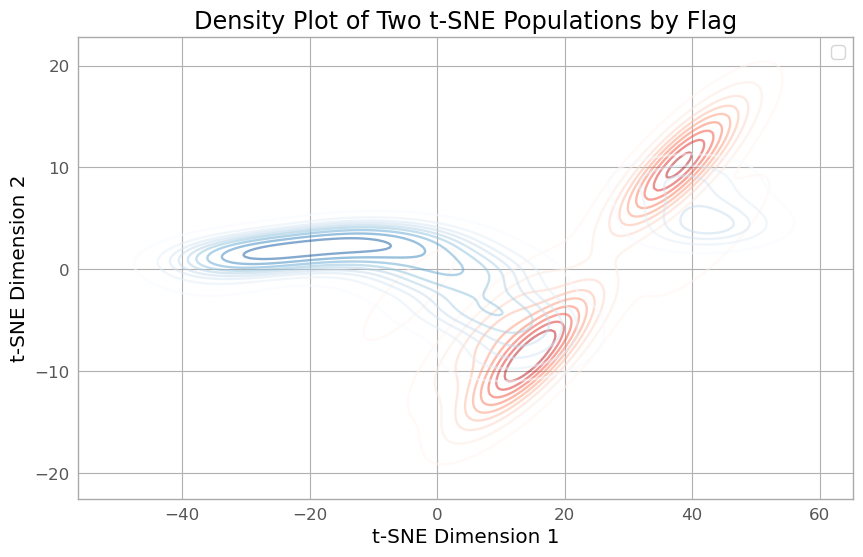

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assume df contains your t-SNE results ('x_tsne', 'y_tsne') and 'flag_column'
# Create a density plot for each population based on the flag

plt.figure(figsize=(10, 6))

# Population 1: flag == 0
sns.kdeplot(x=tsne_df.x.loc[df['BAT T90 [sec]'] <= 2.0], 
            y=tsne_df.y.loc[df['BAT T90 [sec]'] <= 2.0], 
            fill=False, cmap="Reds", label='Population 1 (flag=0)', alpha=0.5)

# Population 2: flag == 1
sns.kdeplot(x=tsne_df.x.loc[df['BAT T90 [sec]'] > 2.0], 
            y=tsne_df.y.loc[df['BAT T90 [sec]'] > 2.0], 
            fill=False, cmap="Blues", label='Population 2 (flag=1)', alpha=0.5)

# Add labels and legend
plt.title('Density Plot of Two t-SNE Populations by Flag')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend()

plt.show()


(array([ 91.,  82.,  79.,  65.,  75.,  85.,  77., 100.,  85., 116., 122.,
        123.,  88.,   1.,   0.,   0.,   0.,   0., 122.,  91.]),
 array([-36.06410217, -32.00936127, -27.95461655, -23.89987373,
        -19.84513092, -15.79038906, -11.73564625,  -7.68090391,
         -3.6261611 ,   0.42858142,   4.48332405,   8.53806686,
         12.59280968,  16.64755249,  20.7022953 ,  24.75703812,
         28.81177902,  32.86652374,  36.92126465,  40.97600937,
         45.03075027]),
 <BarContainer object of 20 artists>)

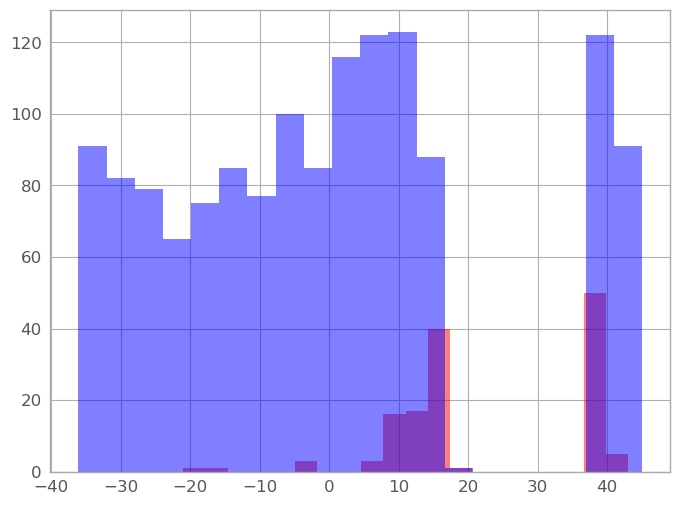

In [14]:
plt.hist(tsne_df.x.loc[short_tninety],bins=20,color="red",alpha=0.5)
plt.hist(tsne_df.x.loc[long_tninety],bins=20,color="blue",alpha=0.5)

(array([  1.,  16.,  23.,  27.,  44.,  52.,  62.,  56.,  59.,  95., 143.,
        329., 241.,  99.,  35.,  32.,  25.,  25.,  33.,   5.]),
 array([-11.42839241, -10.30029488,  -9.17219639,  -8.04409885,
         -6.91600037,  -5.78790283,  -4.65980482,  -3.53170657,
         -2.4036088 ,  -1.27551079,  -0.14741278,   0.98068517,
          2.10878325,   3.23688102,   4.36497927,   5.49307728,
          6.62117481,   7.74927282,   8.87737083,  10.00546932,
         11.13356686]),
 <BarContainer object of 20 artists>)

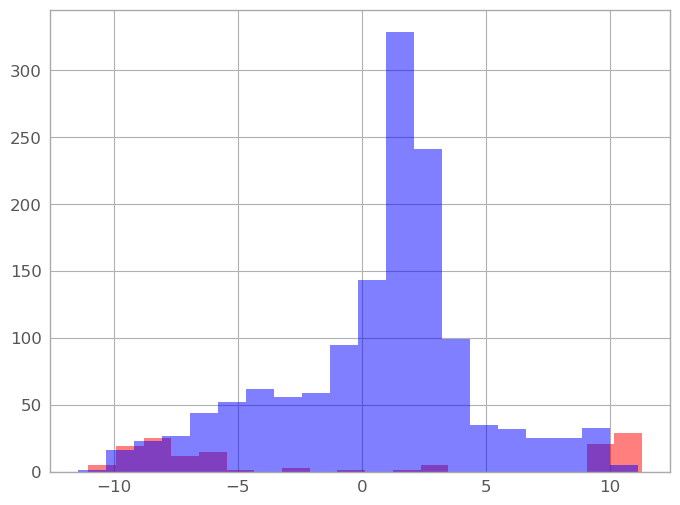

In [15]:
plt.hist(tsne_df.y.loc[short_tninety],bins=20,color="red",alpha=0.5)
plt.hist(tsne_df.y.loc[long_tninety],bins=20,color="blue",alpha=0.5)

In [16]:
tsne_df.y.loc[short_tninety].size

137

In [17]:
tsne_df.y.loc[long_tninety].size

1402